<a href="https://colab.research.google.com/github/9645258/aiffel/blob/main/01_exploration/%5BE-12%5Dexploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **🎄 EXPLORATION 12** 

 - **🌲 EXPLORATION 12-1 : 다양한 OCR모델 비교하기**  
    - **🌿 01_데이터 준비**  
        - **🍃 01-1_필요 라이브러리 import**  
        - **🍃 01-2_필요 데이터 import**  
        - **🍃 01-3_데이터 확인**  
    - **🌿 02_Google OCR**  
    - **🌿 03_keras-OCR**  
    - **🌿 04_Tesseract**  

- **🌲 EXPLORATION 12-2 : 비교 분석**    
    - **🌿 01_함수 생성**  
    - **🌿 02_비교**  
    - **🌿 03_결론**  
        - **🍃 03-1_Keras_ocr**    
        - **🍃 03-2_Tesseract**    
        - **🍃 03-3_Google**    
        - **🍃 03-4_최종 결론**  


<hr>

# **🌲 EXPLORATION 12-1 : 다양한 OCR모델 비교하기**

## **🌿 01_데이터 준비**

### **🍃 01-1_필요 라이브러리 import**

In [ ]:
import os
import cv2
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.image as img
%matplotlib inline

import keras_ocr

import pytesseract
from PIL import Image
from pytesseract import Output

import warnings
warnings.filterwarnings("ignore")

### **🍃 01-2_필요 데이터 import**

In [ ]:
img_dir = os.getenv('HOME')+'/aiffel/ocr_python/cards'
cards = os.listdir(img_dir)
cards

['img_20.png',
 'img_06.png',
 'img_01.png',
 'img_12.png',
 'img_04.png',
 'img_14.png',
 'img_19.png',
 'img_09.png',
 'img_16.png',
 'img_10.png',
 'img_02.png',
 'img_05.png',
 'img_07.png',
 'img_15.png',
 'img_13.png',
 'img_08.png',
 'img_03.png',
 'img_18.png',
 'img_11.png',
 'img_17.png']

### **🍃 01-3_데이터 확인**

- **데이터 선정: 명함**  
명함을 인식해 자동으로 연락처를 등록해주는 어플리케이션을 차용해 이와 비슷한 기능을 하는 모델을 만들어 보고자 명함을 데이터로 선정하여 작업 진행  

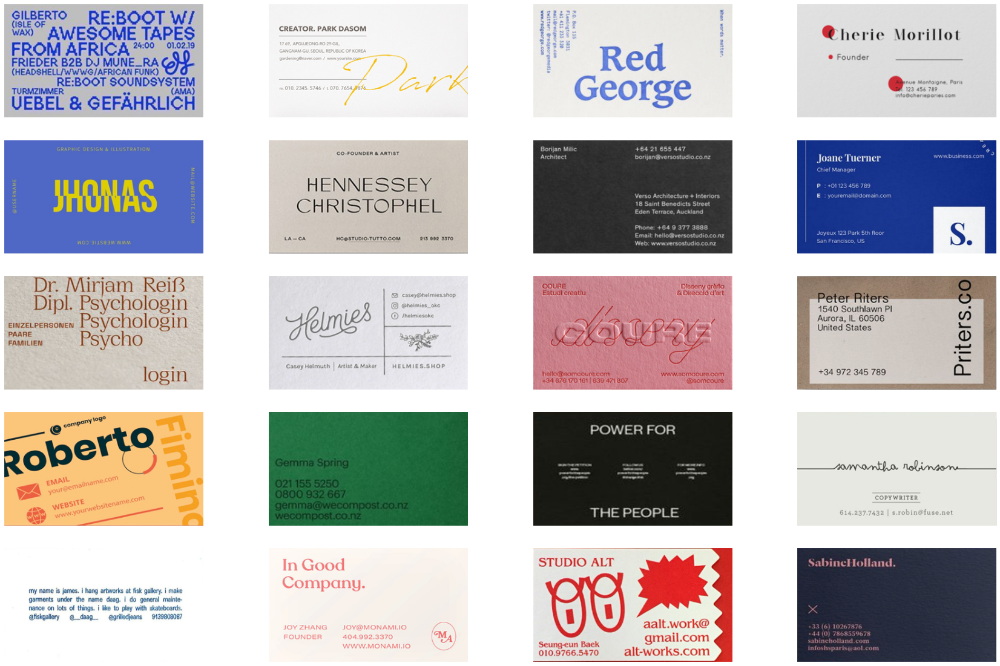

In [ ]:
plt.figure(figsize=(30,20))

for idx, im in enumerate(cards):
    im =  img_dir +'/'+ im
    plt.subplot(5, 4, idx+1)
    im = img.imread(im)
    plt.imshow(im)
    plt.axis('off')

## **🌿 02_Google OCR**

In [ ]:
!ls -l $GOOGLE_APPLICATION_CREDENTIALS
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/my_google_api_key.json'

def detect_text(path):
    """Detects text in the file."""
    from google.cloud import vision
    import io
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')

    for text in texts:
       print('\n"{}"'.format(text.description))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))

total 988
-rw-r--r-- 1 root root 1003704 Jun 15 21:41 '[E-12]exploration.ipynb'
drwxr-xr-x 4 root root    4096 Jun 15 15:13  ocr_python


[img_20.png]


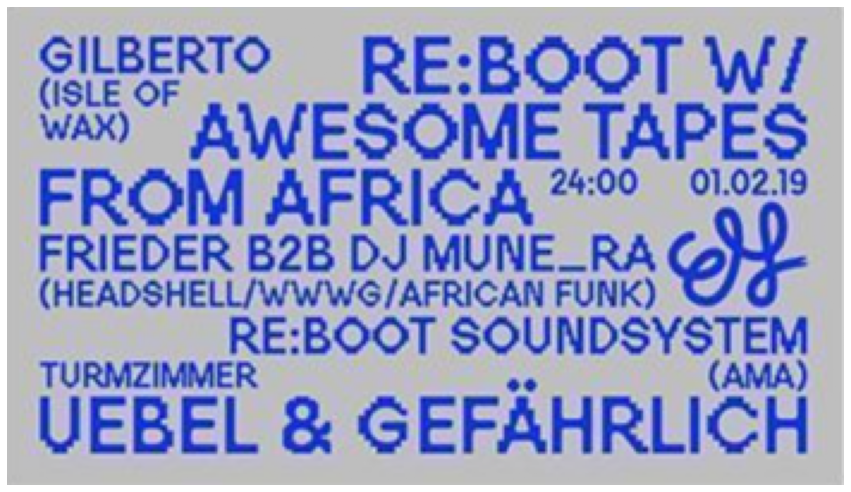

Texts:

"GILBERTO RE:BOOT W/
(ISLE OF
WAX) AWESOME
TAPES
FROM AFRICA 24:00 01.02.19
FRIEDER B2B DJ MUNE_RA
(HEADSHELL/WWWG/AFRICAN FUNK)
Ef
RE:BOOT SOUNDSYSTEM
TURMZIMMER
(AMA)
UEBEL & GEFÄHRLICH"

"GILBERTO"

"RE"

":"

"BOOT"

"W"

"/"

"("

"ISLE"

"OF"

"WAX"

")"

"AWESOME"

"TAPES"

"FROM"

"AFRICA"

"24:00"

"01.02.19"

"FRIEDER"

"B2B"

"DJ"

"MUNE_RA"

"("

"HEADSHELL"

"/"

"WWWG"

"/"

"AFRICAN"

"FUNK"

")"

"Ef"

"RE"

":"

"BOOT"

"SOUNDSYSTEM"

"TURMZIMMER"

"("

"AMA"

")"

"UEBEL"

"&"

"GEFÄHRLICH"

[img_06.png]


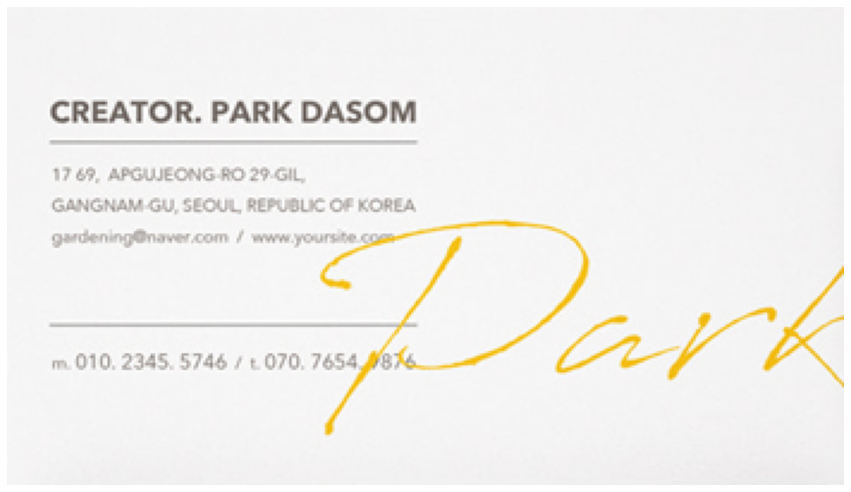

Texts:

"CREATOR. PARK DASOM
1769, APGUJEONG RO 29, GIL,
GANGNAM-GU, SEOUL, REPUBLIC OF KOREA
gardening@naver.com / www.yoursite.com
m. 010.2345. 5746/L070. 7654876
Dark"

"CREATOR"

"."

"PARK"

"DASOM"

"1769"

","

"APGUJEONG"

"RO"

"29"

","

"GIL"

","

"GANGNAM"

"-"

"GU"

","

"SEOUL"

","

"REPUBLIC"

"OF"

"KOREA"

"gardening@naver.com"

"/"

"www.yoursite.com"

"m"

"."

"010.2345"

"."

"5746"

"/"

"L070"

"."

"7654876"

"Dark"



In [ ]:
for idx, card in enumerate(cards):
    if idx < 2:
        print(f'[{card}]')
        plt.figure(figsize=(15,10))
        plt.imshow(img.imread(img_dir+'/'+card))
        plt.axis('off')
        plt.show()
        detect_text(os.path.join(img_dir, card))
        print()

## **🌿 03_keras-OCR**


In [ ]:
pipeline = keras_ocr.pipeline.Pipeline()

images = [keras_ocr.tools.read(os.path.join(img_dir, card)) for card in cards]
prediction_groups = [pipeline.recognize([os.path.join(img_dir, card)]) for card in cards]

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


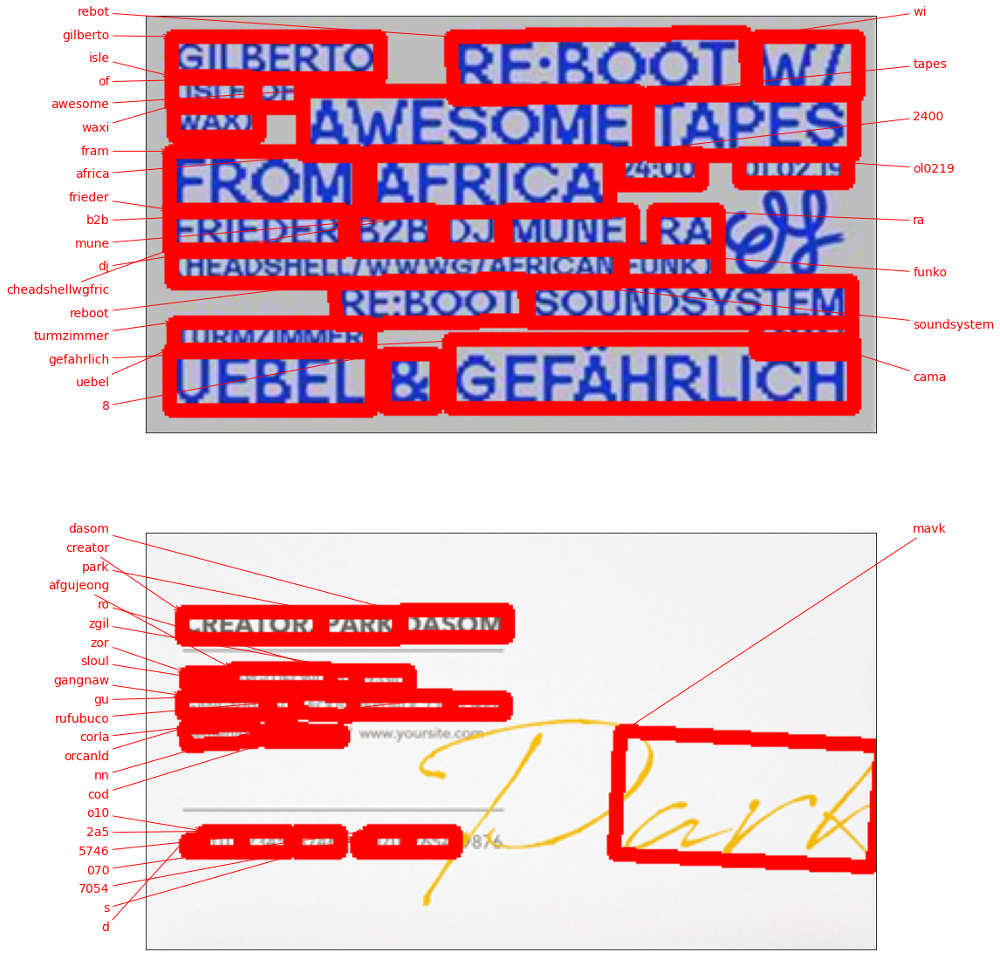

In [ ]:
fig, axs = plt.subplots(nrows=2, figsize=(15, 20))
for idx, ax in enumerate(axs):
    if idx <2:
        keras_ocr.tools.drawAnnotations(image=images[idx], 
                                        predictions=prediction_groups[idx][0], ax=ax)

## **🌿 04_Tesseract**

In [ ]:
def recognize_images(image_path='./images/sample.png', output_path='./sample'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='eng',
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")

            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1

    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='eng',
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])

[img_20.png]


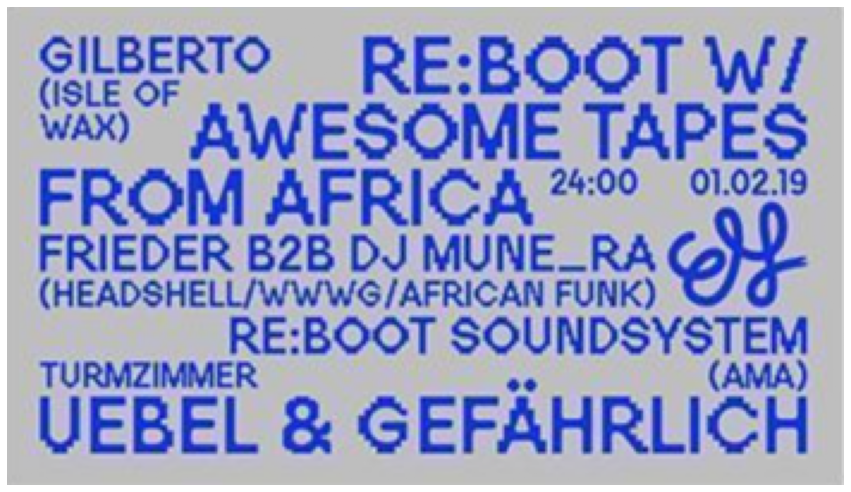

(Sle OF |

RE ROOT

Wi

AX)

AWESOME

TAPES

ROM

AFRICA

24%°OO

01.02.19

ERIF DER

BAB

DJ

MUNE _

(HEADSHELL/WWWG/AFRICAN

FUNK

vzimeee’

ROOT


ERE


GEFAHRLICH

[img_06.png]


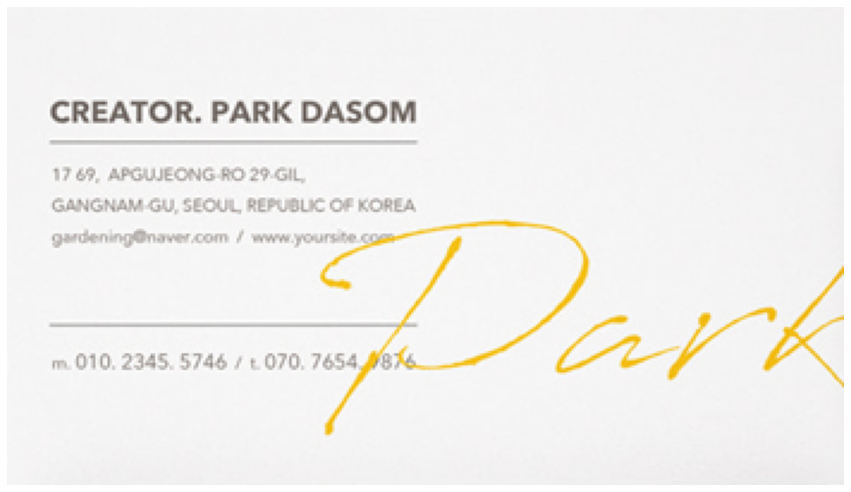

CREATOR.

PARK

DASOM

einen

4M,

SEOUL,

PerPULSLe Cf ROPE A

on

EA

eee eo teer

[img_01.png]


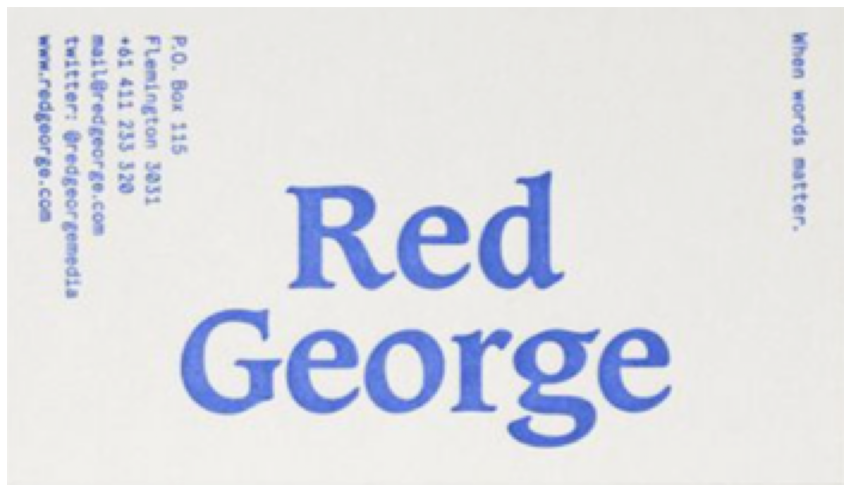

In [ ]:
save_dir = os.getenv('HOME')+'/aiffel/ocr_python/cards/'

for idx, card in enumerate(cards):
    if idx <3:
        print(f'[{card}]')
        plt.figure(figsize=(15,10))
        plt.imshow(img.imread(img_dir+'/'+card))
        plt.axis('off')
        plt.show()
        try:
            recognize_images(os.path.join(img_dir, card), save_dir)
        except:
            print(f'Cannot recognize characters from {card}')

<hr>

# **🌲 EXPLORATION 12-2 : 비교 분석**

## **🌿 01_함수 생성**

In [ ]:
def compare_ocr(card):
    idx = cards.index(card)
    keras_ocr.tools.drawAnnotations(image=images[idx], predictions=prediction_groups[idx][0])
    plt.title('02_keras-ocr')
    plt.show()

    print('\n')
    print('03_Tesseract')
    print('\n')
    recognize_images(os.path.join(img_dir, card), save_dir)
        
    print('-----------------------------------------------------------------------')
    print('\n')
    
    print('04_Google')
    print('\n')
    detect_text(os.path.join(img_dir, card))

In [ ]:
def original(new_img_name):
    new_image_path = os.getenv('HOME')+'/aiffel/ocr_python/cards/' + new_img_name
    img_bgr = cv2.imread(new_image_path)
    img_show = img_bgr.copy()
    plt.figure(figsize=(10, 7)) 
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title('01_original')
    plt.axis('off')

## **🌿 02_비교**

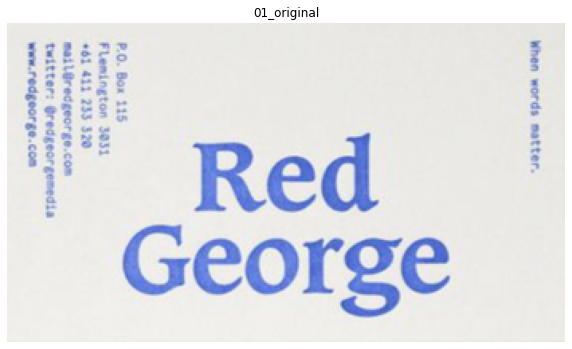

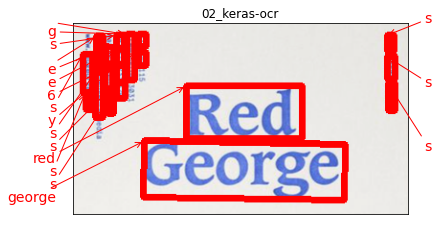



03_Tesseract



-----------------------------------------------------------------------


04_Google


Texts:

"When words matter.
Red
George
P.O. Box 115
Flemington 3031
+61 411 253 320
mail@redgeorge.com
twitter: @redgeorgemedia
www.redgeorge.com"

"When"

"words"

"matter"

"."

"Red"

"George"

"P.O."

"Box"

"115"

"Flemington"

"3031"

"+61"

"411"

"253"

"320"

"mail@redgeorge.com"

"twitter"

":"

"@redgeorgemedia"

"www.redgeorge.com"


In [ ]:
original('img_01.png'); compare_ocr('img_01.png')

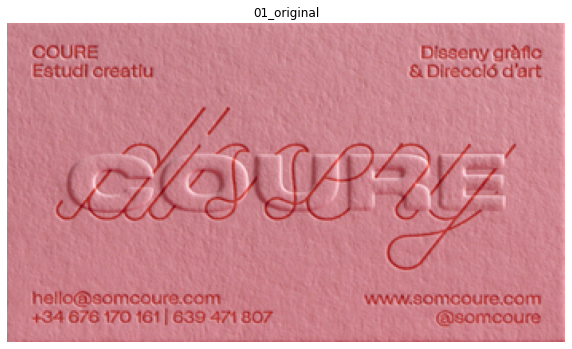

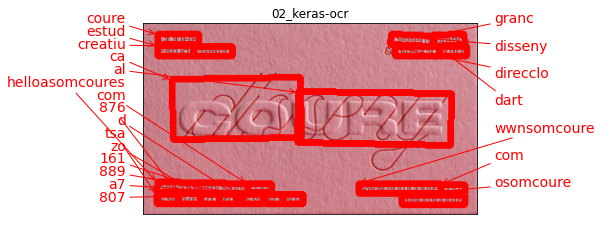



03_Tesseract


. : ? 2G

nelio@somcoure.com

+3

er

wz

at

639 471 807

80;


aratio

MS LTeconio

dart

WW WSO COUT). Ooi

(SOMCOUre

-----------------------------------------------------------------------


04_Google


Texts:

"COURE
Estudi creatiu
Disseny gràfic
& Direcció d'art
davay
hello@somcoure.com
www.somcoure.com
+34 676 170 161 | 639 471 807
@somcoure"

"COURE"

"Estudi"

"creatiu"

"Disseny"

"gràfic"

"&"

"Direcció"

"d'art"

"davay"

"hello@somcoure.com"

"www.somcoure.com"

"+34"

"676"

"170"

"161"

"|"

"639"

"471"

"807"

"@somcoure"


In [ ]:
original('img_02.png'); compare_ocr('img_02.png')

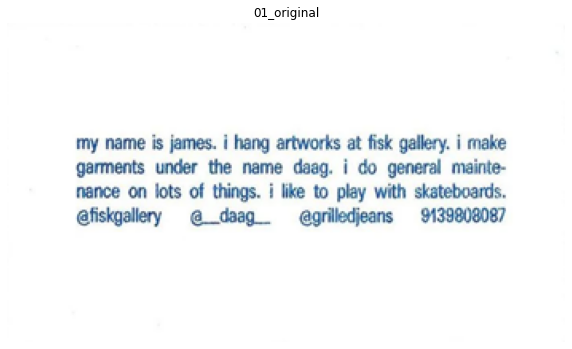

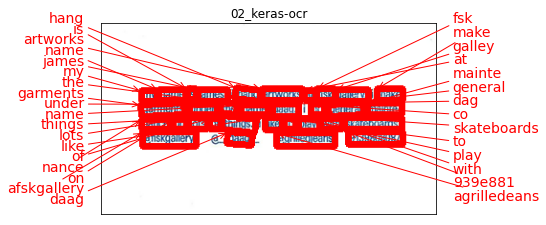



03_Tesseract


m

nam

i

james.


‘hang

ye

a

fisk

gel.



‘garments



“name

daeg,

1

do

‘genera




lot

ol



tc

ple

with

skateboards

@ dsag. @gfillecjeans

M4 2ORNRDR)

-----------------------------------------------------------------------


04_Google


Texts:

"my name is james. i hang artworks at fisk gallery, i make
garments under the name daag. i do general mainte-
nance on lots of things. i like to play with skateboards.
@fiskgallery @_daag @grilledjeans 9139808087"

"my"

"name"

"is"

"james"

"."

"i"

"hang"

"artworks"

"at"

"fisk"

"gallery"

","

"i"

"make"

"garments"

"under"

"the"

"name"

"daag"

"."

"i"

"do"

"general"

"mainte"

"nance"

"on"

"lots"

"of"

"things"

"."

"i"

"like"

"to"

"play"

"with"

"skateboards"

"."

"@fiskgallery"

"@_daag"

"@grilledjeans"

"9139808087"


In [ ]:
original('img_03.png'); compare_ocr('img_03.png')

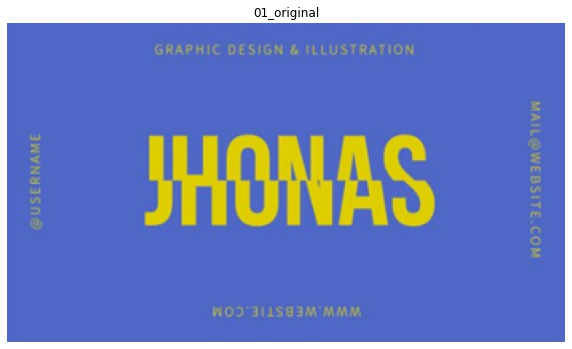

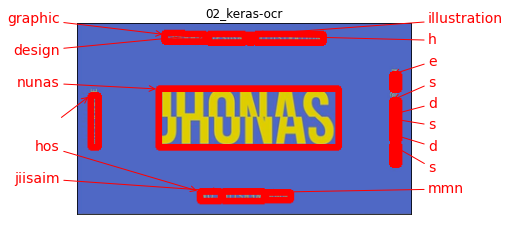



03_Tesseract


)

-----------------------------------------------------------------------


04_Google


Texts:

"@USERNAME
GRAPHIC DESIGN & ILLUSTRATION
JHONAS
WWW.WEBSTIE.COM
MAIL@WEBSITE.COM"

"@USERNAME"

"GRAPHIC"

"DESIGN"

"&"

"ILLUSTRATION"

"JHONAS"

"WWW.WEBSTIE.COM"

"MAIL@WEBSITE.COM"


In [ ]:
original('img_04.png'); compare_ocr('img_04.png')

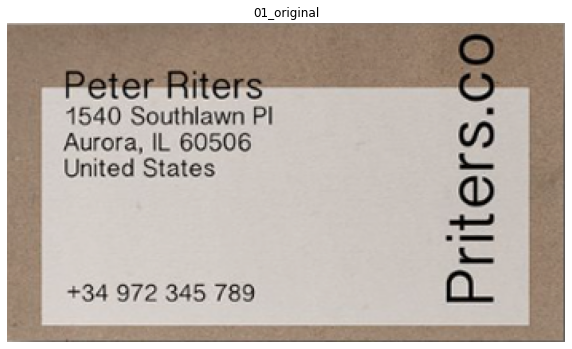

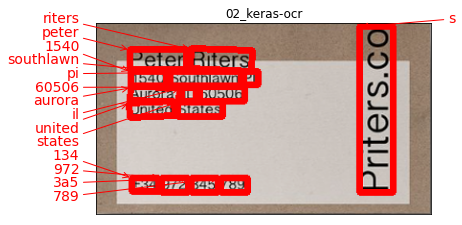



03_Tesseract


1540

Southlawn

|

Aurora,

yt

DU5Ub

United

States

/

oem

CG

eee

—

aq

+34

4/7

345

(39

— :

-----------------------------------------------------------------------


04_Google


Texts:

"Peter Riters
1540 Southlawn Pl
Aurora, IL 60506
United States
+34 972 345 789
Priters.co"

"Peter"

"Riters"

"1540"

"Southlawn"

"Pl"

"Aurora"

","

"IL"

"60506"

"United"

"States"

"+34"

"972"

"345"

"789"

"Priters.co"


In [ ]:
original('img_05.png'); compare_ocr('img_05.png')

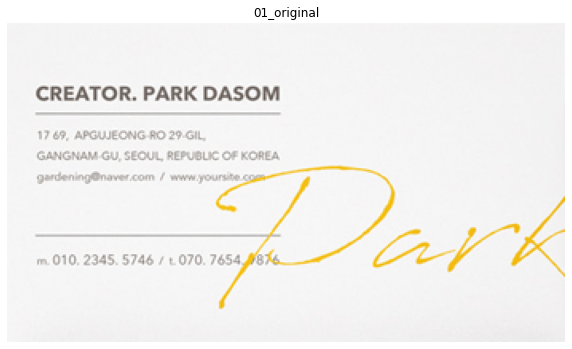

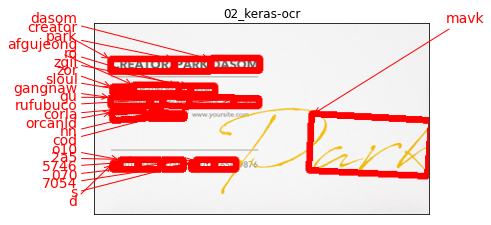



03_Tesseract


CREATOR.

PARK

DASOM

einen

4M,

SEOUL,

PerPULSLe Cf ROPE A

on

EA

eee eo teer

-----------------------------------------------------------------------


04_Google


Texts:

"CREATOR. PARK DASOM
1769, APGUJEONG RO 29, GIL,
GANGNAM-GU, SEOUL, REPUBLIC OF KOREA
gardening@naver.com / www.yoursite.com
m. 010.2345. 5746/L070. 7654876
Dark"

"CREATOR"

"."

"PARK"

"DASOM"

"1769"

","

"APGUJEONG"

"RO"

"29"

","

"GIL"

","

"GANGNAM"

"-"

"GU"

","

"SEOUL"

","

"REPUBLIC"

"OF"

"KOREA"

"gardening@naver.com"

"/"

"www.yoursite.com"

"m"

"."

"010.2345"

"."

"5746"

"/"

"L070"

"."

"7654876"

"Dark"


In [ ]:
original('img_06.png'); compare_ocr('img_06.png')

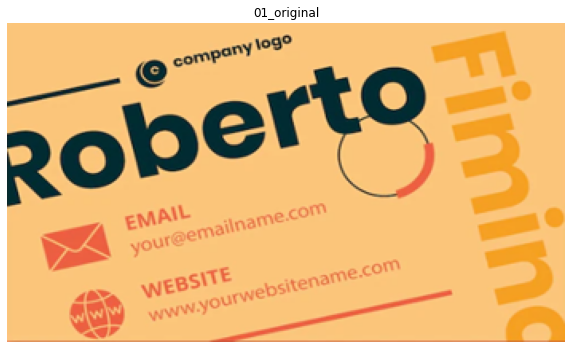

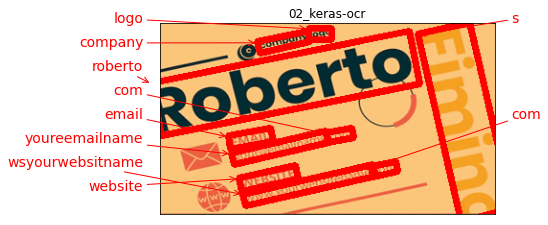



03_Tesseract



-----------------------------------------------------------------------


04_Google


Texts:

"company logo
Roberto
EMAIL
your@emailname.com
WEBSITE
www
www.yourwebsitename.com
Fiming"

"company"

"logo"

"Roberto"

"EMAIL"

"your@emailname.com"

"WEBSITE"

"www"

"www.yourwebsitename.com"

"Fiming"


In [ ]:
original('img_07.png'); compare_ocr('img_07.png')

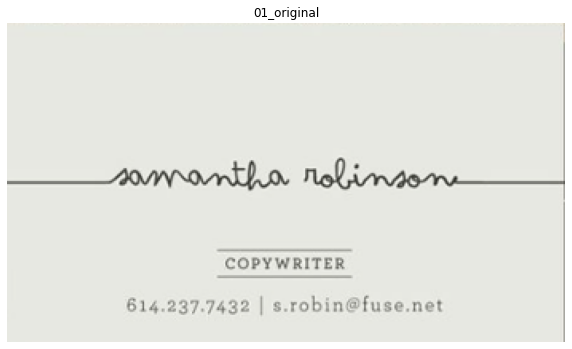

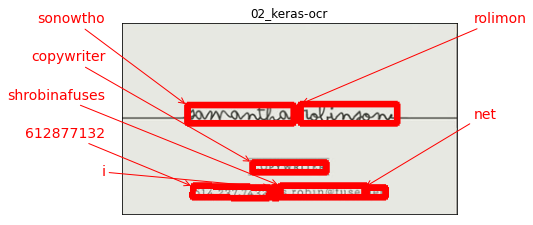



03_Tesseract


Om Por

:

COMP Y WHITE

614.237.7432

|

e robin@tuse net

-----------------------------------------------------------------------


04_Google


Texts:

"samantha robinsone
COPYWRITER
614.237.7432 s.robin@fuse.net"

"samantha"

"robinsone"

"COPYWRITER"

"614.237.7432"

"s.robin@fuse.net"


In [ ]:
original('img_08.png'); compare_ocr('img_08.png')

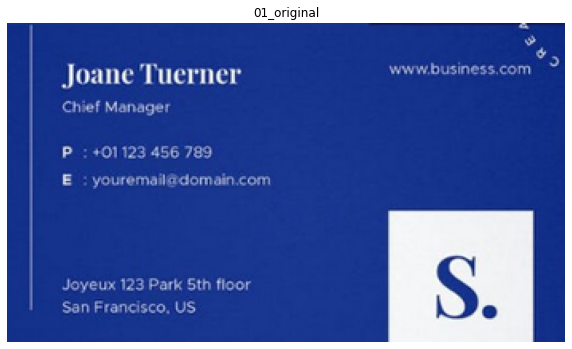

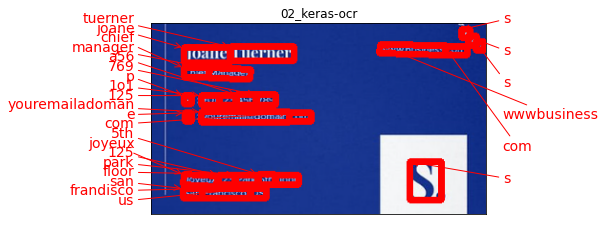



03_Tesseract


joane

eT!

lau

WWW DUSINGSS

Ot tlt i

7,

wee OPE ho eee?

Se . Youremanacomancom

Jon

Joyeux 123

stn floor

=

Francsco

US

e

rast

-----------------------------------------------------------------------


04_Google


Texts:

"Joane Tuerner
Chief Manager
P: +01 123 456 789
E youremail@domain.com
Joyeux 123 Park 5th floor
San Francisco, US
'ਤੇ ਖੜੇ
www.business.com
S."

"Joane"

"Tuerner"

"Chief"

"Manager"

"P"

":"

"+01"

"123"

"456"

"789"

"E"

"youremail@domain.com"

"Joyeux"

"123"

"Park"

"5th"

"floor"

"San"

"Francisco"

","

"US"

"'"

"ਤੇ"

"ਖੜੇ"

"www.business.com"

"S."


In [ ]:
original('img_09.png'); compare_ocr('img_09.png')

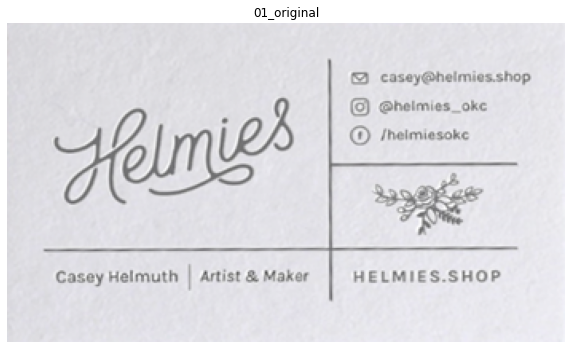

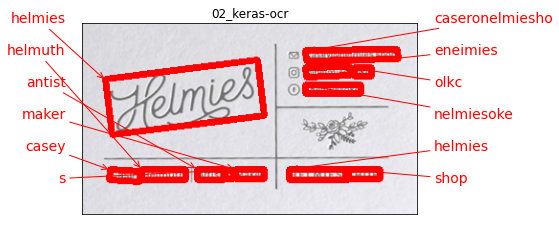



03_Tesseract


folie

casey

Helmuth


Artist & Maaer

a

Maaer


~)

casey@nhelrues.shop

OC}

) enti

ok

(+)

fhelrruesokc

wpe

HMELMIES SHOP



-----------------------------------------------------------------------


04_Google


Texts:

"Helmies
Casey Helmuth 1 Artist & Maker
casey@helmies.shop
O@helmies_okc
O /helmiesokc
HELMIES.SHOP"

"Helmies"

"Casey"

"Helmuth"

"1"

"Artist"

"&"

"Maker"

"casey@helmies.shop"

"O"

"@"

"helmies_okc"

"O"

"/"

"helmiesokc"

"HELMIES.SHOP"


In [ ]:
original('img_10.png'); compare_ocr('img_10.png')

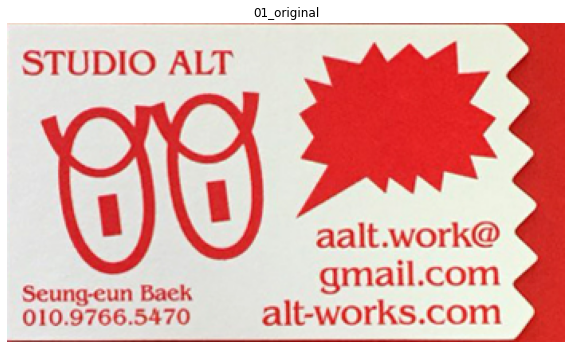

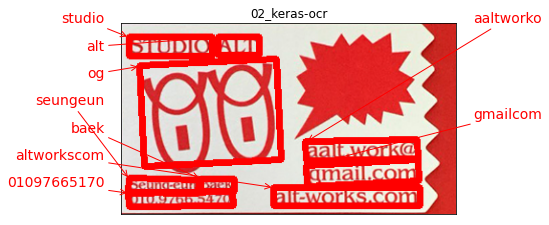



03_Tesseract


ed @


sues aleworks.com 4

we :

STUDIO

ALT

ae

Bae,


aait. WOrkK@

gmail.com

ait-worKkKs.com

e

010.

5766/5470

-----------------------------------------------------------------------


04_Google


Texts:

"STUDIO ALT
80
aalt.work@
gmail.com
Seung-eun Baek
010.9766.5470 alt-works.com"

"STUDIO"

"ALT"

"80"

"aalt.work"

"@"

"gmail.com"

"Seung"

"-"

"eun"

"Baek"

"010.9766.5470"

"alt-works.com"


In [ ]:
original('img_11.png'); compare_ocr('img_11.png')

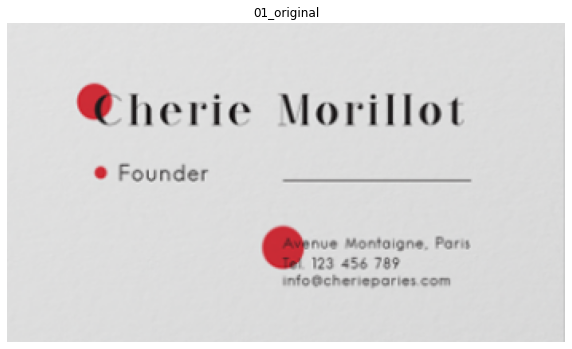

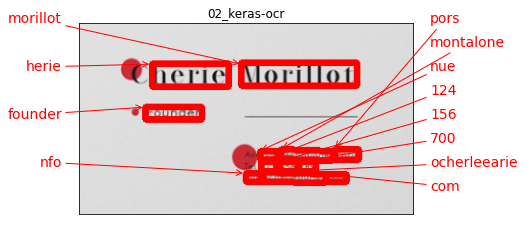



03_Tesseract


© herie

\lortllot

S

Founder

="

-----------------------------------------------------------------------


04_Google


Texts:

"Cherie Morillot
● Founder
Avenue Montaigne, Paris
Tel 123 456 789
info@cherieparies.com"

"Cherie"

"Morillot"

"●"

"Founder"

"Avenue"

"Montaigne"

","

"Paris"

"Tel"

"123"

"456"

"789"

"info@cherieparies.com"


In [ ]:
original('img_12.png'); compare_ocr('img_12.png')

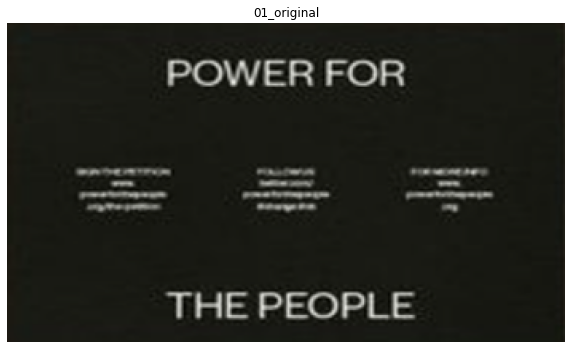

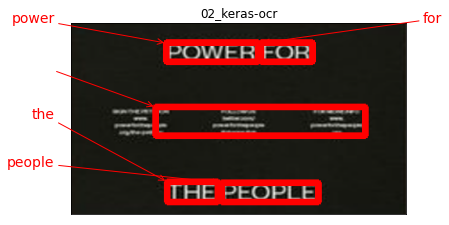



03_Tesseract


POVVER

ne) =;


THE

320) 82

-----------------------------------------------------------------------


04_Google


Texts:

"POWER FOR
THE PEOPLE"

"POWER"

"FOR"

"THE"

"PEOPLE"


In [ ]:
original('img_13.png'); compare_ocr('img_13.png')

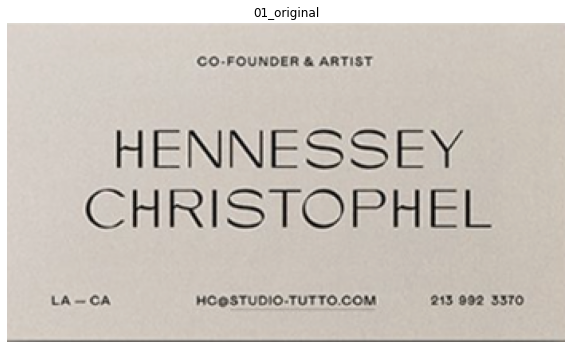

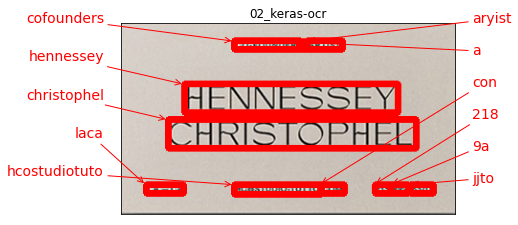



03_Tesseract


HENNESSE Y

CHRIS |OPRHEL

Le

HC@STUDIO-TUTTO.COM

-----------------------------------------------------------------------


04_Google


Texts:

"CO-FOUNDER & ARTIST
HENNESSEY
CHRISTOPHEL
LA CA
HCOSTUDIO-TUTTO.COM
213 992 3370"

"CO"

"-"

"FOUNDER"

"&"

"ARTIST"

"HENNESSEY"

"CHRISTOPHEL"

"LA"

"CA"

"HCOSTUDIO-TUTTO.COM"

"213"

"992"

"3370"


In [ ]:
original('img_14.png'); compare_ocr('img_14.png')

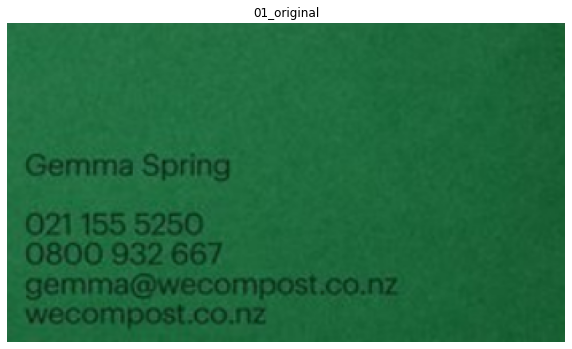

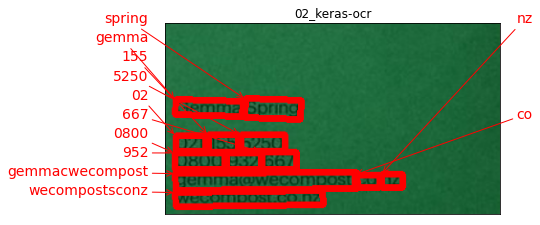



03_Tesseract


Gemma

Spring

O71 155

5250

O800O

0°32

66 /

Gemma@wecompost.co.nz

-----------------------------------------------------------------------


04_Google


Texts:

"Gemma Spring
021 155 5250
0800 932 667
gemma@wecompost.co.nz
wecompost.co.nz"

"Gemma"

"Spring"

"021"

"155"

"5250"

"0800"

"932"

"667"

"gemma@wecompost.co.nz"

"wecompost.co.nz"


In [ ]:
original('img_15.png'); compare_ocr('img_15.png')

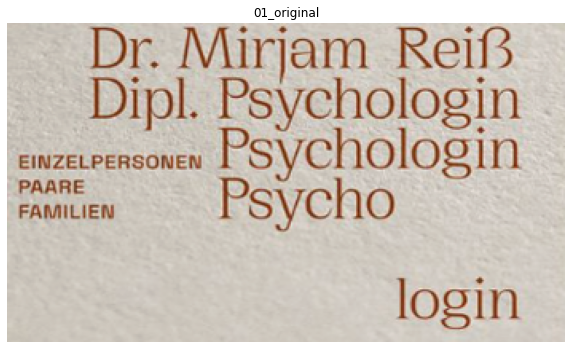

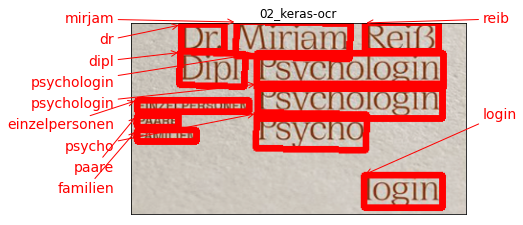



03_Tesseract


Dr.

Mirjam

Kelfs

Dipl.

Psychologin

EINZELRPENHSUNEN

Psychologin

Ae

PSycno

login

-----------------------------------------------------------------------


04_Google


Texts:

"Dr. Mirjam Reiß
Dipl. Psychologin
Psychologin
Psycho
login
EINZELPERSONEN
PAARE
FAMILIEN"

"Dr."

"Mirjam"

"Reiß"

"Dipl"

"."

"Psychologin"

"Psychologin"

"Psycho"

"login"

"EINZELPERSONEN"

"PAARE"

"FAMILIEN"


In [ ]:
original('img_16.png'); compare_ocr('img_16.png')

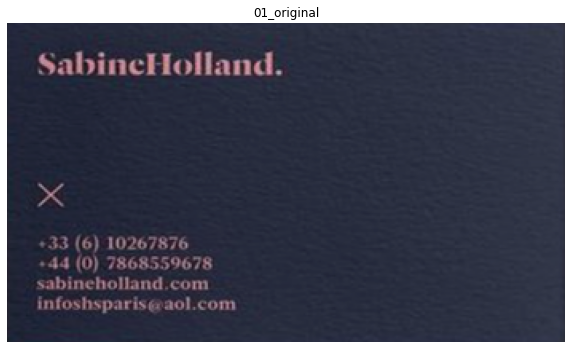

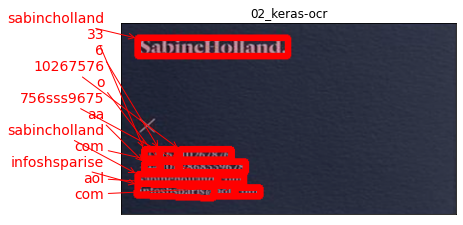



03_Tesseract


SabincHolland.

es

(3

LPT

|

{O)

48BORS59678

ssbpinehollianda

whee

infoshsparis@aol.com

-----------------------------------------------------------------------


04_Google


Texts:

"SabineHolland.
X
+33 (6) 10267876
+44 (0) 7868559678
sabineholland.com
infoshsparis@aol.com"

"SabineHolland"

"."

"X"

"+33"

"("

"6"

")"

"10267876"

"+44"

"("

"0"

")"

"7868559678"

"sabineholland.com"

"infoshsparis@aol.com"


In [ ]:
original('img_17.png'); compare_ocr('img_17.png')

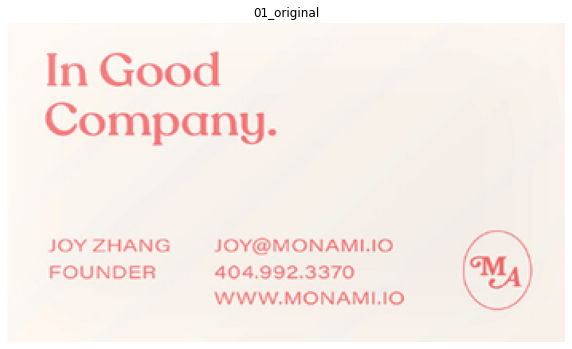

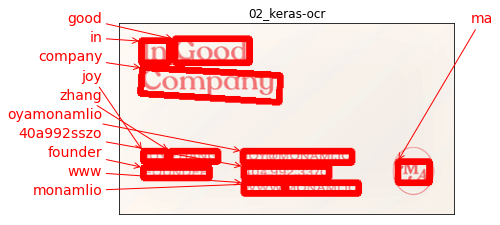



03_Tesseract


in

(Good

Company.

OY

ZHANG

ue

JOY@MONAMI,IO

-OUNDER

4$04.992.33/0

WWVVMONAMIIO

-----------------------------------------------------------------------


04_Google


Texts:

"In Good
Company.
JOY ZHANG
FOUNDER
JOY@MONAMI.IO
404.992.3370
WWW.MONAMI.IO
MA"

"In"

"Good"

"Company"

"."

"JOY"

"ZHANG"

"FOUNDER"

"JOY@MONAMI.IO"

"404.992.3370"

"WWW.MONAMI.IO"

"MA"


In [ ]:
original('img_18.png'); compare_ocr('img_18.png')

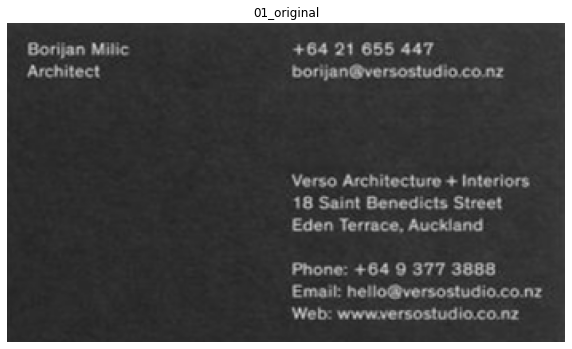

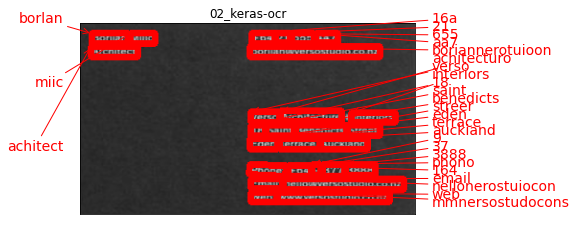



03_Tesseract


Soran Milic

Architect

+64 21655 447

co

an

ersostucio.co nz

Verso Archnriecture

+ interiors

16 Saint Benedicts Street

1.

nee

Phone: +64 Y

CV melt et.

au ue

hello@versostudio.co.nz

Wehr www yersostucio.co nr

ae

Oconr

-----------------------------------------------------------------------


04_Google


Texts:

"Borijan Milic
Architect
+64 21 655 447
borijan@versostudio.co.nz
Verso Architecture + Interiors
18 Saint Benedicts Street
Eden Terrace, Auckland
Phone: +64 9 377 3888
Email: hello@versostudio.co.nz
Web: www.versostudio.co.nz"

"Borijan"

"Milic"

"Architect"

"+64"

"21"

"655"

"447"

"borijan@versostudio.co.nz"

"Verso"

"Architecture"

"+"

"Interiors"

"18"

"Saint"

"Benedicts"

"Street"

"Eden"

"Terrace"

","

"Auckland"

"Phone"

":"

"+64"

"9"

"377"

"3888"

"Email"

":"

"hello@versostudio.co.nz"

"Web"

":"

"www.versostudio.co.nz"


In [ ]:
original('img_19.png'); compare_ocr('img_19.png')

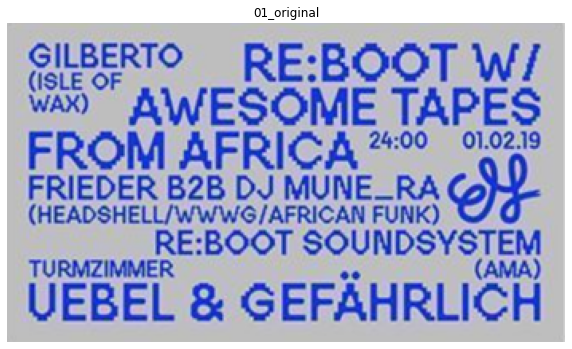

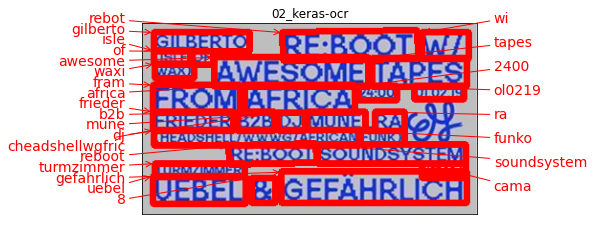



03_Tesseract


(Sle OF |

RE ROOT

Wi

AX)

AWESOME

TAPES

ROM

AFRICA

24%°OO

01.02.19

ERIF DER

BAB

DJ

MUNE _

(HEADSHELL/WWWG/AFRICAN

FUNK

vzimeee’

ROOT


ERE


GEFAHRLICH

-----------------------------------------------------------------------


04_Google


Texts:

"GILBERTO RE:BOOT W/
(ISLE OF
WAX) AWESOME
TAPES
FROM AFRICA 24:00 01.02.19
FRIEDER B2B DJ MUNE_RA
(HEADSHELL/WWWG/AFRICAN FUNK)
Ef
RE:BOOT SOUNDSYSTEM
TURMZIMMER
(AMA)
UEBEL & GEFÄHRLICH"

"GILBERTO"

"RE"

":"

"BOOT"

"W"

"/"

"("

"ISLE"

"OF"

"WAX"

")"

"AWESOME"

"TAPES"

"FROM"

"AFRICA"

"24:00"

"01.02.19"

"FRIEDER"

"B2B"

"DJ"

"MUNE_RA"

"("

"HEADSHELL"

"/"

"WWWG"

"/"

"AFRICAN"

"FUNK"

")"

"Ef"

"RE"

":"

"BOOT"

"SOUNDSYSTEM"

"TURMZIMMER"

"("

"AMA"

")"

"UEBEL"

"&"

"GEFÄHRLICH"


In [ ]:
original('img_20.png'); compare_ocr('img_20.png')

## **🌿 03_결론**

### **🍃 03-1_Keras_ocr**

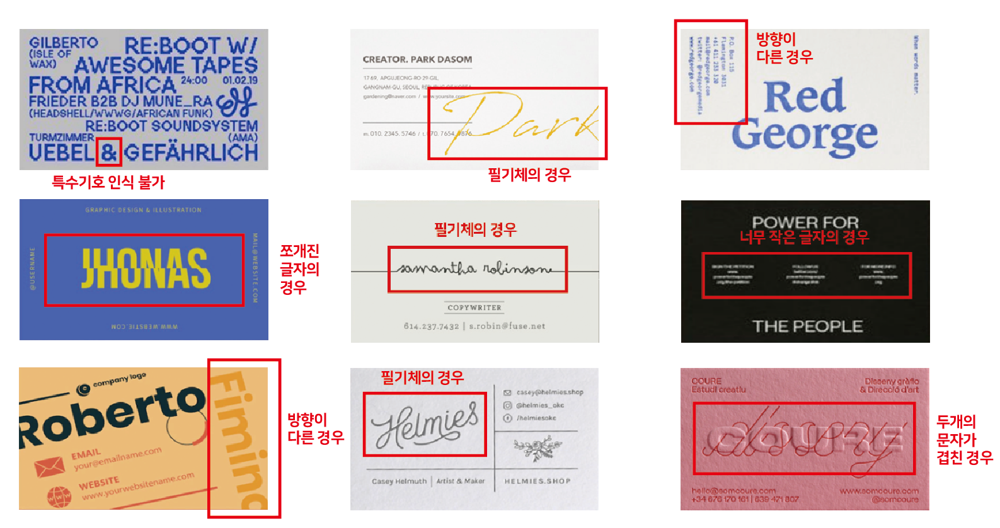

- **인식 가능**    
일반 큰 문자  

- **인식 불가**  
두개의 문자가 겹친 경우, 방향이 다른 경우, 쪼개진 글자의 경우, 필기체, 특수 문자, 비슷하게 생긴 문자는 틀리는 경우 다수 발생  

### **🍃 03-2_Tesseract**

**세가지 모델 중 가장 인식이 안됨**  

<br>

- **인식 가능**    
일반 큰 문자, 특수 문자   

- **인식 불가**  
두개의 문자가 겹친 경우, 방향이 다른 경우, 필기체, 비슷하게 생긴 문자는 틀리는 경우 다수 발생  

### **🍃 03-3_Google**

**세가지 모델 중 가장 인식이 잘됨**  

<br>

- **인식 가능**    
두개의 문자가 겹친 경우, 방향이 다른 경우, 필기체, 특수 문자, 쪼개진 문자   

- **인식 불가**  
딱히 없으나 비슷하게 생긴 문자는 약간 틀리는 경우가 발생, 쪼개진 문자는 글자로 인식하나 다른 문자로 읽는 경우가 많음   



### **🍃 03-4_최종 결론**  

자동으로 연락처를 등록해주는 어플리케이션의 아이디어를 차용해 명함을 인식해보았다. Google이 가장 인식률이 높았고, Tesseract가 가장 인식률이 낮았다. 특히 Google의 경우에는 필기체나 작은 글씨도 잘 인식했고, 약간의 잘못 읽는 부분이 있기는 했지만 어느 정도 큰 형태의 모습은 비슷하게 맞춰냈다. 이런 부분을 활용해 형식이 정해져 있는 명함이나 영수증을 활용한 인식 및 데이터 수집으로 쉽게 가계부나 연락처 등록을 할 수 있을 것으로 예상된다.

<hr>